In [2]:
#import libraries 
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d
from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

## Import data


In [4]:
path = R'C:\Users\shaiv\Downloads\ClimateWins'

In [7]:
df = pd.read_csv(os.path.join(path, '02 Data', 'weather prediction dataset processed scaled.csv'),index_col = 0)

In [8]:
df.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186


In [9]:
df['DATE'].max()

20221031

In [10]:
pd.set_option('display.max_columns', None)

### look at a year of temperature data for one of the weather stations (BASEL 1962)

In [16]:
df2 = df[['DATE', 'MONTH','BASEL_cloud_cover','BASEL_wind_speed','BASEL_humidity','BASEL_pressure',
      'BASEL_global_radiation','BASEL_precipitation','BASEL_snow_depth','BASEL_sunshine',
      'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min','BASEL_temp_max']].copy()

In [18]:
df2

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,-0.902918,-0.528623,-0.845652,-0.478356
1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,-0.810126,-0.582946,-0.462450,-0.569988
2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,-1.065304,-0.257010,-0.186545,-0.592896
3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,-0.114186,-0.555784,-0.385810,-0.512718
4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,0.187388,-1.003946,-1.075573,-1.039603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,0.720943,0.747959,0.779123,0.724314
22946,20221028,10,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,0.187388,0.856604,1.223637,0.781585
22947,20221029,10,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,0.349774,0.856604,1.039701,0.838855
22948,20221030,10,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,0.280180,0.680055,0.809780,0.689952


In [19]:
# Drop the DATE and MONTH data as those numbers are not scaled with the rest
notemp = df2.drop(['DATE', 'MONTH'], axis = 1)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(1, 0, 'BASEL_cloud_cover'),
  Text(2, 0, 'BASEL_wind_speed'),
  Text(3, 0, 'BASEL_humidity'),
  Text(4, 0, 'BASEL_pressure'),
  Text(5, 0, 'BASEL_global_radiation'),
  Text(6, 0, 'BASEL_precipitation'),
  Text(7, 0, 'BASEL_snow_depth'),
  Text(8, 0, 'BASEL_sunshine'),
  Text(9, 0, 'BASEL_sunshine'),
  Text(10, 0, 'BASEL_temp_mean'),
  Text(11, 0, 'BASEL_temp_min'),
  Text(12, 0, 'BASEL_temp_max')])

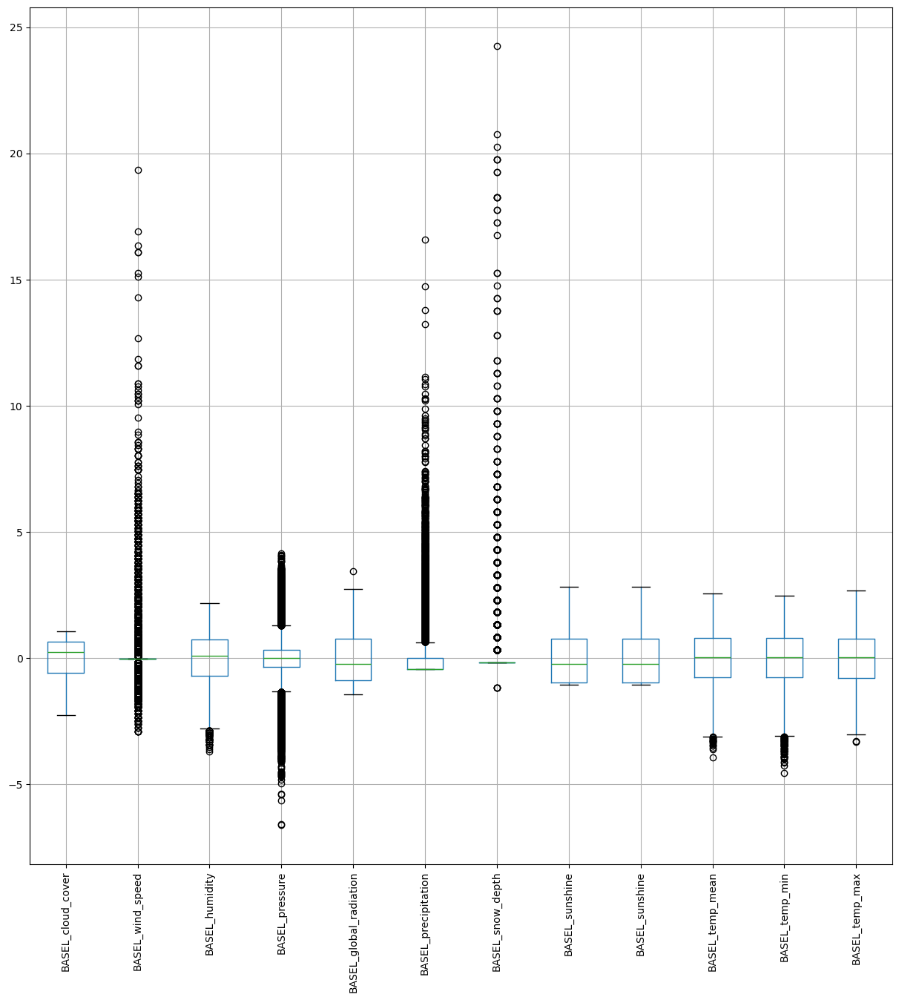

In [22]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

In [23]:
#Reduce your dataset to a single year
dfyear = df2[df2['DATE'].astype(str).str.contains('1962')] 
dfyear

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
731,19620101,1,1.076130,-0.02793,1.910140,-0.001949,-1.251420,5.165884,-0.179228,-1.065304,-1.065304,-1.316301,-1.044917,-0.833430
732,19620102,1,1.076130,-0.02793,2.000476,-0.001949,-1.251420,-0.245107,20.257548,-1.065304,-1.065304,-1.655817,-1.382134,-1.749751
733,19620103,1,1.076130,-0.02793,2.090813,-0.001949,-1.251420,-0.205026,19.260632,-1.065304,-1.065304,-2.131140,-2.117882,-1.944469
734,19620104,1,0.244897,-0.02793,1.819803,-0.001949,-1.251420,-0.445514,17.765258,-1.065304,-1.065304,-1.764463,-1.933945,-1.726843
735,19620105,1,1.076130,-0.02793,2.181150,-0.001949,-1.251420,-0.445514,16.768342,-1.065304,-1.065304,-1.560753,-1.397462,-1.761205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,19621227,12,-1.001953,-0.02793,1.097107,-0.001949,-0.961452,-0.445514,0.319230,-0.531750,-0.531750,-3.204012,-3.267487,-2.814974
1092,19621228,12,-1.001953,-0.02793,0.645423,-0.001949,-0.725182,0.576562,0.319230,0.442567,0.442567,-2.443495,-3.451424,-2.299543
1093,19621229,12,1.076130,-0.02793,1.548792,-0.001949,-1.251420,-0.084781,3.808436,-1.065304,-1.065304,-2.171882,-2.041241,-2.093371
1094,19621230,12,1.076130,-0.02793,1.548792,-0.001949,-1.251420,0.295992,3.808436,-1.065304,-1.065304,-1.506430,-2.179194,-1.245775


In [24]:
dfyear.describe()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
count,3.650000e+02,365.000000,365.000000,3.650000e+02,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1.962067e+07,6.526027,-0.176413,-2.793014e-02,-0.188647,-1.948634e-03,0.116681,-0.108501,0.286455,0.096503,0.096503,-0.227988,-0.327605,-0.082926
std,3.454755e+02,3.452584,1.125832,1.806589e-16,1.022673,1.194259e-17,1.077963,0.799542,2.440596,1.034925,1.034925,1.098855,1.067577,1.120417
min,1.962010e+07,1.000000,-2.248803,-2.793014e-02,-2.606706,-1.948634e-03,-1.262159,-0.445514,-0.179228,-1.065304,-1.065304,-3.204012,-3.451424,-2.837882
25%,1.962040e+07,4.000000,-1.001953,-2.793014e-02,-0.980642,-1.948634e-03,-0.875535,-0.445514,-0.179228,-0.949314,-0.949314,-1.139752,-1.044917,-0.936517
50%,1.962070e+07,7.000000,0.244897,-2.793014e-02,-0.257946,-1.948634e-03,-0.070069,-0.445514,-0.179228,-0.044592,-0.044592,-0.270591,-0.370482,-0.066012
75%,1.962100e+07,10.000000,1.076130,-2.793014e-02,0.645423,-1.948634e-03,1.014626,-0.164944,-0.179228,0.883329,0.883329,0.693636,0.533874,0.850309
max,1.962123e+07,12.000000,1.076130,-2.793014e-02,2.181150,-1.948634e-03,2.421507,5.165884,20.257548,2.368002,2.368002,2.078863,1.729464,2.408054


In [28]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

In [30]:
notempyear

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
731,1.076130,-0.02793,1.910140,-0.001949,-1.251420,5.165884,-0.179228,-1.065304,-1.065304,-1.316301,-1.044917,-0.833430
732,1.076130,-0.02793,2.000476,-0.001949,-1.251420,-0.245107,20.257548,-1.065304,-1.065304,-1.655817,-1.382134,-1.749751
733,1.076130,-0.02793,2.090813,-0.001949,-1.251420,-0.205026,19.260632,-1.065304,-1.065304,-2.131140,-2.117882,-1.944469
734,0.244897,-0.02793,1.819803,-0.001949,-1.251420,-0.445514,17.765258,-1.065304,-1.065304,-1.764463,-1.933945,-1.726843
735,1.076130,-0.02793,2.181150,-0.001949,-1.251420,-0.445514,16.768342,-1.065304,-1.065304,-1.560753,-1.397462,-1.761205
...,...,...,...,...,...,...,...,...,...,...,...,...
1091,-1.001953,-0.02793,1.097107,-0.001949,-0.961452,-0.445514,0.319230,-0.531750,-0.531750,-3.204012,-3.267487,-2.814974
1092,-1.001953,-0.02793,0.645423,-0.001949,-0.725182,0.576562,0.319230,0.442567,0.442567,-2.443495,-3.451424,-2.299543
1093,1.076130,-0.02793,1.548792,-0.001949,-1.251420,-0.084781,3.808436,-1.065304,-1.065304,-2.171882,-2.041241,-2.093371
1094,1.076130,-0.02793,1.548792,-0.001949,-1.251420,0.295992,3.808436,-1.065304,-1.065304,-1.506430,-2.179194,-1.245775


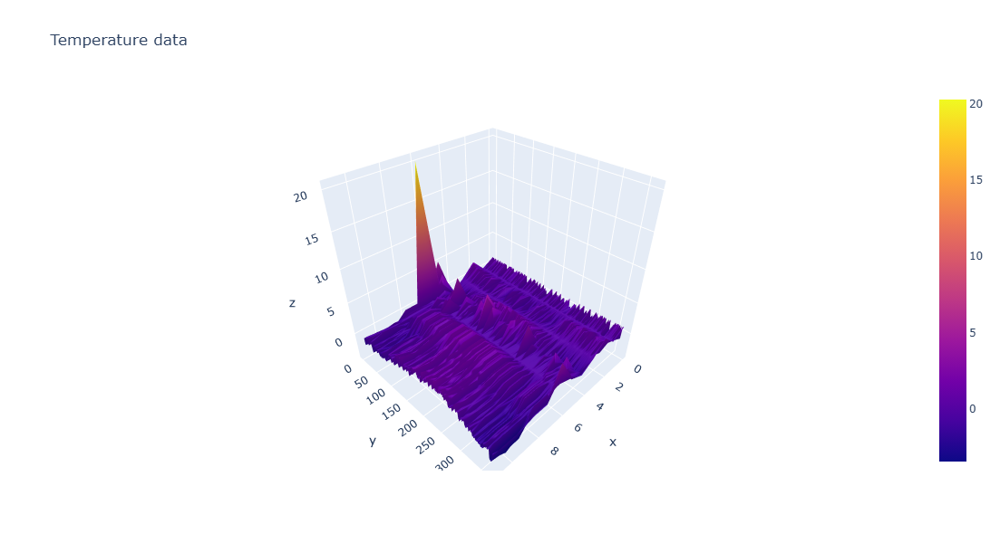

In [32]:


fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                  width=600, height=600)
fig.show()

In [33]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [34]:
n_rows = dfyear.shape[0]
n_rows

365

In [35]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1) 

In [36]:
X.shape, y.shape

((365, 2), (365, 1))

In [37]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['BASEL_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [38]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear['BASEL_temp_mean'].min()

-3.2040120998121213

In [39]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear['BASEL_temp_mean'].max()

2.078862799472186

In [48]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [50]:
compute_cost(X,y)

array([0.62807681])

In [52]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [54]:
%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 0 ns


In [55]:
theta

array([[-0.36024104],
       [ 0.07245748]])

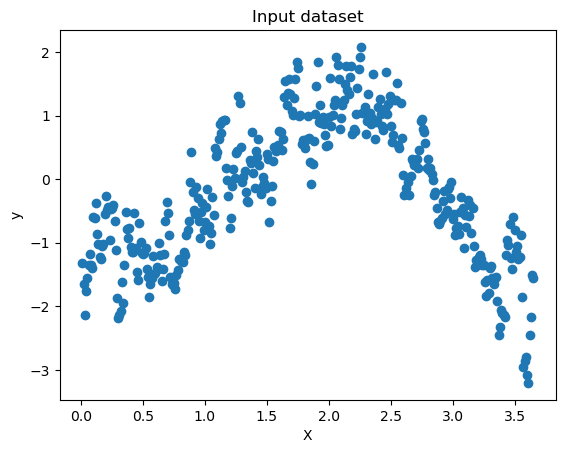

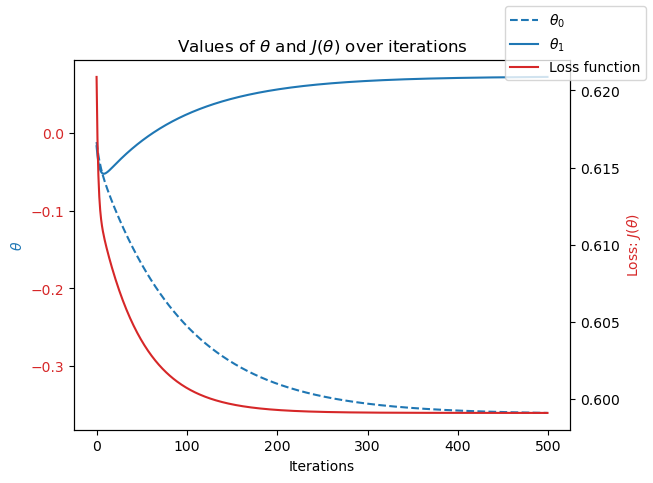

In [58]:

#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()
# Display the plot with the legend
plt.show()

In [59]:
%%time
# theta range
theta0_vals = np.linspace(-10.02, 9.98, 100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.82, 10.18, 100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.41 s
Wall time: 2.42 s


In [422]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [61]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [62]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[-0.2],[-0.2]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.05 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [63]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

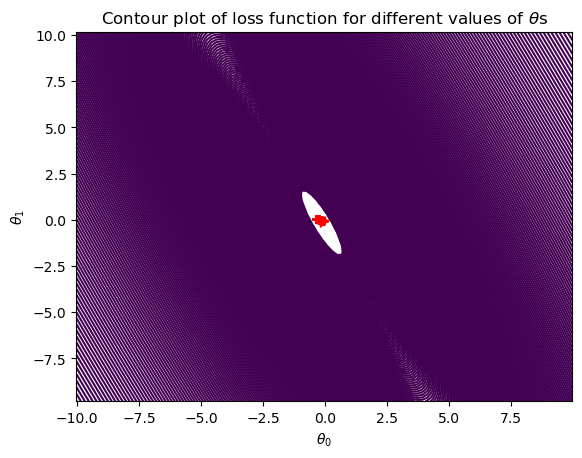

In [65]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

### look at a year of temperature data for one of the weather stations (BASEL 1990)

In [67]:
df3 = df[['DATE', 'MONTH','BASEL_cloud_cover','BASEL_wind_speed','BASEL_humidity','BASEL_pressure',
      'BASEL_global_radiation','BASEL_precipitation','BASEL_snow_depth','BASEL_sunshine',
      'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min','BASEL_temp_max']].copy()

In [68]:
# Drop the DATE and MONTH data as those numbers are not scaled with the rest
notemp3 = df3.drop(['DATE', 'MONTH'], axis = 1)

In [69]:
notemp3

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,-0.902918,-0.528623,-0.845652,-0.478356
1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,-0.810126,-0.582946,-0.462450,-0.569988
2,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,-1.065304,-0.257010,-0.186545,-0.592896
3,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,-0.114186,-0.555784,-0.385810,-0.512718
4,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,0.187388,-1.003946,-1.075573,-1.039603
...,...,...,...,...,...,...,...,...,...,...,...,...
22945,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,0.720943,0.747959,0.779123,0.724314
22946,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,0.187388,0.856604,1.223637,0.781585
22947,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,0.349774,0.856604,1.039701,0.838855
22948,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,0.280180,0.680055,0.809780,0.689952


In [70]:
#Reduce your dataset to a single year
dfyear3 = df3[df3['DATE'].astype(str).str.contains('1990')] 
dfyear3

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
10958,19900101,1,-2.248803,-0.027930,0.645423,0.563561,-0.800359,-0.445514,-0.179228,0.604953,0.604953,-1.696559,-1.520087,-1.589395
10959,19900102,1,-1.417570,-0.027930,0.735760,0.884527,-0.929233,-0.445514,-0.179228,-0.531750,-0.531750,-1.655817,-1.566071,-1.532125
10960,19900103,1,1.076130,-0.027930,1.187444,0.777538,-1.229941,-0.445514,-0.179228,-1.065304,-1.065304,-1.710140,-1.612055,-1.681027
10961,19900104,1,-1.417570,-0.027930,0.103401,1.297196,-0.864796,-0.445514,-0.179228,0.233784,0.233784,-1.506430,-1.443447,-1.474855
10962,19900105,1,0.660514,-0.027930,0.464749,1.618161,-1.197722,-0.365351,-0.179228,-1.018908,-1.018908,-1.411366,-1.443447,-1.429039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,19901227,12,0.660514,5.705005,-0.348283,-0.949560,-1.079587,-0.205026,-0.179228,-0.694136,-0.694136,-0.515042,-0.692371,-0.524172
11319,19901228,12,-1.001953,0.791061,-0.438620,0.471857,-0.800359,-0.405433,-0.179228,0.465765,0.465765,-0.895301,-0.723027,-0.936517
11320,19901229,12,0.660514,3.794027,-0.528957,-0.261778,-1.272899,0.576562,-0.179228,-1.042106,-1.042106,-0.012558,-0.370482,0.094344
11321,19901230,12,1.076130,1.337054,-0.167609,0.624698,-1.315857,0.576562,-0.179228,-1.065304,-1.065304,0.218313,0.303953,0.048528


In [71]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear3 = dfyear3.drop(['DATE','MONTH'], axis=1)

In [72]:
notempyear3

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
10958,-2.248803,-0.027930,0.645423,0.563561,-0.800359,-0.445514,-0.179228,0.604953,0.604953,-1.696559,-1.520087,-1.589395
10959,-1.417570,-0.027930,0.735760,0.884527,-0.929233,-0.445514,-0.179228,-0.531750,-0.531750,-1.655817,-1.566071,-1.532125
10960,1.076130,-0.027930,1.187444,0.777538,-1.229941,-0.445514,-0.179228,-1.065304,-1.065304,-1.710140,-1.612055,-1.681027
10961,-1.417570,-0.027930,0.103401,1.297196,-0.864796,-0.445514,-0.179228,0.233784,0.233784,-1.506430,-1.443447,-1.474855
10962,0.660514,-0.027930,0.464749,1.618161,-1.197722,-0.365351,-0.179228,-1.018908,-1.018908,-1.411366,-1.443447,-1.429039
...,...,...,...,...,...,...,...,...,...,...,...,...
11318,0.660514,5.705005,-0.348283,-0.949560,-1.079587,-0.205026,-0.179228,-0.694136,-0.694136,-0.515042,-0.692371,-0.524172
11319,-1.001953,0.791061,-0.438620,0.471857,-0.800359,-0.405433,-0.179228,0.465765,0.465765,-0.895301,-0.723027,-0.936517
11320,0.660514,3.794027,-0.528957,-0.261778,-1.272899,0.576562,-0.179228,-1.042106,-1.042106,-0.012558,-0.370482,0.094344
11321,1.076130,1.337054,-0.167609,0.624698,-1.315857,0.576562,-0.179228,-1.065304,-1.065304,0.218313,0.303953,0.048528


In [73]:

fig = go.Figure(data=[go.Surface(z=notempyear3.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                  width=600, height=600)
fig.show()

In [75]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [77]:
n_rows3 = dfyear3.shape[0]
n_rows3

365

In [78]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear3['BASEL_temp_mean'].to_numpy().reshape(n_rows,1) 

In [81]:
X.shape, y.shape

((365, 2), (365, 1))

In [82]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear3['BASEL_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [89]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear3['BASEL_temp_mean'].min()

-1.8187852624676497

In [92]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear3['BASEL_temp_mean'].max()

1.9973788678636883

In [93]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [101]:
compute_cost(X,y)

array([0.40745449])

In [104]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [107]:
%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=600 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 0 ns


In [108]:
theta

array([[-0.06532768],
       [ 0.07443594]])

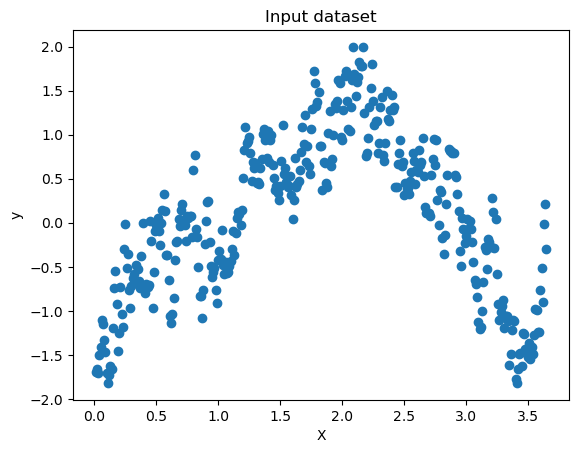

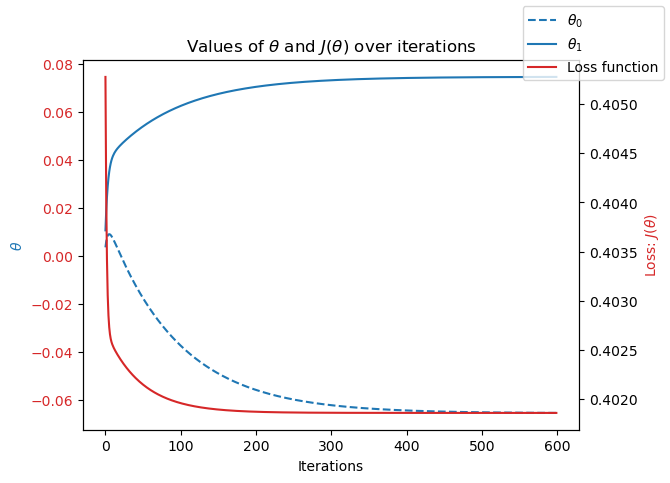

In [109]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()
# Display the plot with the legend
plt.show()

In [112]:
%%time
# theta range
theta0_vals = np.linspace(-10.06, 10.06, 100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.92, 10.08, 100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.94 s
Wall time: 1.93 s


In [113]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [115]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (BASEL 2020)

In [117]:
df3['DATE'] = pd.to_datetime(df3['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [118]:
#Reduce your dataset to a single year
baselyear4 = df3[df3['DATE'].astype(str).str.contains('2019')] 
baselyear4

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,2019-01-01,1,0.244897,0.518064,0.916434,2.336512,-0.617786,-0.305229,-0.179228,-1.065304,-1.065304,-0.732333,-0.677043,-1.051057
21551,2019-01-02,1,0.660514,-0.164429,-0.619294,2.703329,-1.090326,-0.425473,-0.179228,-1.042106,-1.042106,-0.963204,-0.922292,-1.119781
21552,2019-01-03,1,-1.001953,-1.802410,-0.438620,3.253555,-0.628526,-0.445514,-0.179228,0.117794,0.117794,-1.452108,-1.520087,-1.463401
21553,2019-01-04,1,-0.586336,-1.392915,0.284075,3.085431,-0.650005,-0.445514,-0.179228,0.164190,0.164190,-1.424946,-1.504759,-1.383223
21554,2019-01-05,1,1.076130,-0.710422,0.555086,2.535205,-0.907754,-0.365351,-0.179228,-1.065304,-1.065304,-1.126172,-0.906964,-1.325953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,2019-12-27,12,1.076130,-0.846921,1.458455,1.419469,-1.283638,0.596603,-0.179228,-1.042106,-1.042106,-0.487881,-0.109905,-0.821976
21911,2019-12-28,12,0.660514,-0.300927,0.916434,3.054863,-1.068847,-0.445514,-0.179228,-0.763730,-0.763730,-0.908881,-1.060245,-1.073965
21912,2019-12-29,12,0.244897,-1.392915,1.548792,3.161851,-0.789619,-0.445514,-0.179228,0.071398,0.071398,-1.520011,-1.382134,-1.429039
21913,2019-12-30,12,-1.833187,-0.437426,0.464749,2.657477,-0.757400,-0.445514,-0.179228,0.442567,0.442567,-1.343462,-1.428119,-1.142689


In [119]:
baselyear4.describe()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,2019-07-02 00:00:00,6.526027,-0.079626,-0.190232,-0.326998,-0.158935,-0.044471,-0.014062,-0.158743,0.165398,0.165398,0.170502,0.113129,0.165547
min,2019-01-01 00:00:00,1.000000,-2.248803,-2.075407,-3.058391,-4.327336,-1.305118,-0.445514,-0.179228,-1.065304,-1.065304,-1.669398,-1.872633,-1.887199
25%,2019-04-02 00:00:00,4.000000,-0.586336,-1.119918,-1.070979,-0.903708,-0.950712,-0.445514,-0.179228,-0.902918,-0.902918,-0.555784,-0.738355,-0.604350
50%,2019-07-02 00:00:00,7.000000,0.244897,-0.573924,-0.257946,-0.185357,-0.295600,-0.445514,-0.179228,-0.021394,-0.021394,0.096087,0.104688,0.140160
75%,2019-10-01 00:00:00,10.000000,0.660514,0.245067,0.555086,0.563561,0.778355,-0.024659,-0.179228,1.068913,1.068913,0.897346,0.871092,0.907579
max,2019-12-31 00:00:00,12.000000,1.076130,5.978002,1.729466,3.253555,1.916748,5.486535,1.814604,2.414398,2.414398,2.540605,2.465211,2.556956
std,NaN,3.452584,0.967001,1.375183,1.082488,1.347153,0.947565,0.931946,0.170089,1.073503,1.073503,0.976797,0.965366,0.979090


In [120]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear4 = baselyear4.drop(['DATE','MONTH'], axis=1)

In [121]:
notempyear4

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,0.244897,0.518064,0.916434,2.336512,-0.617786,-0.305229,-0.179228,-1.065304,-1.065304,-0.732333,-0.677043,-1.051057
21551,0.660514,-0.164429,-0.619294,2.703329,-1.090326,-0.425473,-0.179228,-1.042106,-1.042106,-0.963204,-0.922292,-1.119781
21552,-1.001953,-1.802410,-0.438620,3.253555,-0.628526,-0.445514,-0.179228,0.117794,0.117794,-1.452108,-1.520087,-1.463401
21553,-0.586336,-1.392915,0.284075,3.085431,-0.650005,-0.445514,-0.179228,0.164190,0.164190,-1.424946,-1.504759,-1.383223
21554,1.076130,-0.710422,0.555086,2.535205,-0.907754,-0.365351,-0.179228,-1.065304,-1.065304,-1.126172,-0.906964,-1.325953
...,...,...,...,...,...,...,...,...,...,...,...,...
21910,1.076130,-0.846921,1.458455,1.419469,-1.283638,0.596603,-0.179228,-1.042106,-1.042106,-0.487881,-0.109905,-0.821976
21911,0.660514,-0.300927,0.916434,3.054863,-1.068847,-0.445514,-0.179228,-0.763730,-0.763730,-0.908881,-1.060245,-1.073965
21912,0.244897,-1.392915,1.548792,3.161851,-0.789619,-0.445514,-0.179228,0.071398,0.071398,-1.520011,-1.382134,-1.429039
21913,-1.833187,-0.437426,0.464749,2.657477,-0.757400,-0.445514,-0.179228,0.442567,0.442567,-1.343462,-1.428119,-1.142689


In [122]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [124]:
n_rows4 = baselyear4.shape[0]
n_rows4

365

In [126]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows4,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows4,1))
X = np.concatenate((ones, X), axis=1)
y=baselyear4['BASEL_temp_mean'].to_numpy().reshape(n_rows4,1) 

In [127]:
X.shape, y.shape

((365, 2), (365, 1))

In [135]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=baselyear4['BASEL_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [139]:
baselyear4

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,2019-01-01,1,0.244897,0.518064,0.916434,2.336512,-0.617786,-0.305229,-0.179228,-1.065304,-1.065304,-0.732333,-0.677043,-1.051057
21551,2019-01-02,1,0.660514,-0.164429,-0.619294,2.703329,-1.090326,-0.425473,-0.179228,-1.042106,-1.042106,-0.963204,-0.922292,-1.119781
21552,2019-01-03,1,-1.001953,-1.802410,-0.438620,3.253555,-0.628526,-0.445514,-0.179228,0.117794,0.117794,-1.452108,-1.520087,-1.463401
21553,2019-01-04,1,-0.586336,-1.392915,0.284075,3.085431,-0.650005,-0.445514,-0.179228,0.164190,0.164190,-1.424946,-1.504759,-1.383223
21554,2019-01-05,1,1.076130,-0.710422,0.555086,2.535205,-0.907754,-0.365351,-0.179228,-1.065304,-1.065304,-1.126172,-0.906964,-1.325953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,2019-12-27,12,1.076130,-0.846921,1.458455,1.419469,-1.283638,0.596603,-0.179228,-1.042106,-1.042106,-0.487881,-0.109905,-0.821976
21911,2019-12-28,12,0.660514,-0.300927,0.916434,3.054863,-1.068847,-0.445514,-0.179228,-0.763730,-0.763730,-0.908881,-1.060245,-1.073965
21912,2019-12-29,12,0.244897,-1.392915,1.548792,3.161851,-0.789619,-0.445514,-0.179228,0.071398,0.071398,-1.520011,-1.382134,-1.429039
21913,2019-12-30,12,-1.833187,-0.437426,0.464749,2.657477,-0.757400,-0.445514,-0.179228,0.442567,0.442567,-1.343462,-1.428119,-1.142689


In [142]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
baselyear4['BASEL_temp_mean'].min()

-1.669398054518736

In [144]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
baselyear4['BASEL_temp_mean'].max()

2.540605078587011

In [146]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [148]:
compute_cost(X,y)

array([0.49029456])

In [150]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [152]:
%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05
#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 0 ns


In [153]:
theta

array([[-0.20051936],
       [ 0.20288215]])

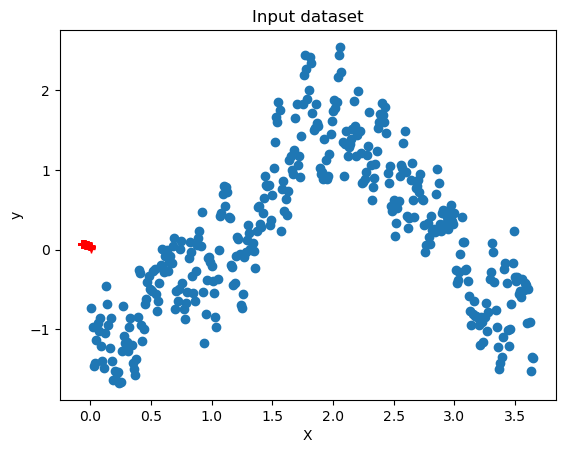

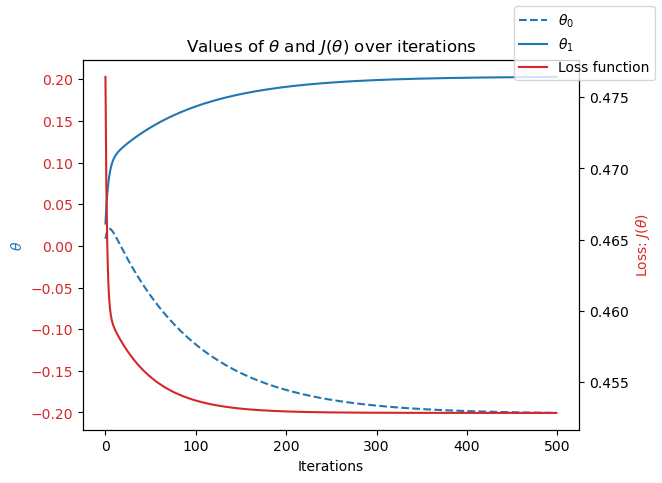

In [156]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()
# Display the plot with the legend
plt.show()

In [157]:
%%time
# theta range
theta0_vals = np.linspace(0.2,-0.02,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(0,0.15,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2 s
Wall time: 2.02 s


In [159]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (Madrid 1960)

In [161]:
madrid= df[['DATE', 'MONTH','MADRID_cloud_cover','MADRID_wind_speed','MADRID_humidity','MADRID_pressure',
      'MADRID_global_radiation','MADRID_precipitation','MADRID_sunshine',
      'MADRID_sunshine', 'MADRID_temp_mean', 'MADRID_temp_min','MADRID_temp_max']].copy()

In [162]:
madrid['DATE'] = pd.to_datetime(madrid['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [163]:
madrid

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,1960-01-01,1,0.855172,-1.419038,1.887115,1.149046,-1.423735,-0.315682,-1.521762,-1.521762,-0.988280,-0.877723,-1.044732
1,1960-01-02,1,1.225610,-0.910841,1.548493,1.068070,-1.496755,-0.315682,-1.642337,-1.642337,-0.691740,-0.411866,-0.882444
2,1960-01-03,1,0.484733,-0.212070,1.774241,1.513435,-1.319420,-0.315682,-1.304726,-1.304726,-0.853490,-0.567152,-1.044732
3,1960-01-04,1,-1.367458,-0.720267,0.927685,1.432460,-0.766551,-0.315682,0.238641,0.238641,-0.624345,-0.862194,-0.430357
4,1960-01-05,1,-0.626581,-0.720267,0.306877,1.270509,-0.829140,-0.315682,0.021605,0.021605,-0.381721,-0.287638,-0.441949
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,2022-10-27,10,1.596048,-0.339119,-0.370367,0.393274,-0.005053,-0.001685,-0.581273,-0.581273,0.683127,0.954646,0.473818
22946,2022-10-28,10,1.596048,-0.021496,-0.426804,0.622705,-0.005053,-0.001685,-0.918884,-0.918884,0.561815,0.721718,0.427450
22947,2022-10-29,10,1.596048,-0.212070,-0.708990,0.150348,-0.005053,-0.001685,0.093950,0.093950,0.548336,0.830417,0.323122
22948,2022-10-30,10,0.484733,-0.720267,0.419752,0.150348,-0.005053,-0.001685,-1.111805,-1.111805,0.103526,0.473261,-0.175333


In [164]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempmad = madrid.drop(['DATE','MONTH'], axis=1)

In [165]:
#Look at a whisker plot of the data to see variations in temperatures
notempmad.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(1, 0, 'MADRID_cloud_cover'),
  Text(2, 0, 'MADRID_wind_speed'),
  Text(3, 0, 'MADRID_humidity'),
  Text(4, 0, 'MADRID_pressure'),
  Text(5, 0, 'MADRID_global_radiation'),
  Text(6, 0, 'MADRID_precipitation'),
  Text(7, 0, 'MADRID_sunshine'),
  Text(8, 0, 'MADRID_sunshine'),
  Text(9, 0, 'MADRID_temp_mean'),
  Text(10, 0, 'MADRID_temp_min'),
  Text(11, 0, 'MADRID_temp_max')])

In [166]:
#Reduce your dataset to a single year
madridyear = madrid[madrid['DATE'].astype(str).str.contains('1960')] #<-----INSERT YEAR HERE
madridyear

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,1960-01-01,1,0.855172,-1.419038,1.887115,1.149046,-1.423735,-0.315682,-1.521762,-1.521762,-0.988280,-0.877723,-1.044732
1,1960-01-02,1,1.225610,-0.910841,1.548493,1.068070,-1.496755,-0.315682,-1.642337,-1.642337,-0.691740,-0.411866,-0.882444
2,1960-01-03,1,0.484733,-0.212070,1.774241,1.513435,-1.319420,-0.315682,-1.304726,-1.304726,-0.853490,-0.567152,-1.044732
3,1960-01-04,1,-1.367458,-0.720267,0.927685,1.432460,-0.766551,-0.315682,0.238641,0.238641,-0.624345,-0.862194,-0.430357
4,1960-01-05,1,-0.626581,-0.720267,0.306877,1.270509,-0.829140,-0.315682,0.021605,0.021605,-0.381721,-0.287638,-0.441949
...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,1960-12-27,12,0.114295,1.058423,1.040559,-0.065587,-1.142085,-0.184850,-0.822424,-0.822424,-1.069155,-1.001951,-1.091100
362,1960-12-28,12,0.114295,2.455966,0.476189,0.649697,-0.912592,-0.054018,-0.147201,-0.147201,-1.338737,-1.172765,-1.427268
363,1960-12-29,12,0.484733,2.837114,0.024692,0.865631,-1.465460,-0.315682,-1.594107,-1.594107,-0.920885,-0.691380,-1.067916
364,1960-12-30,12,0.484733,1.376046,0.419752,0.946607,-0.860435,-0.315682,-0.026625,-0.026625,-0.772615,-0.567152,-0.905628


In [167]:
madridyear.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,366,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1960-07-01 12:00:00,6.513661,0.253969,0.127943,0.151753,-0.219425,0.030858,0.106341,-0.075317,-0.075317,-0.130480,-0.085300,-0.160827
min,1960-01-01 00:00:00,1.000000,-1.367458,-1.419038,-2.007042,-2.791761,-1.684522,-0.315682,-1.859373,-1.859373,-2.322710,-2.337406,-2.250299
25%,1960-04-01 06:00:00,4.000000,-0.626581,-0.720267,-0.821864,-0.683025,-0.996044,-0.315682,-1.129891,-1.129891,-0.890557,-0.753495,-1.021548
50%,1960-07-01 12:00:00,7.000000,0.484733,-0.021496,0.194003,-0.241033,-0.046779,-0.315682,0.106008,0.106008,-0.294107,-0.225524,-0.291253
75%,1960-09-30 18:00:00,9.750000,1.225610,1.058423,1.153433,0.244819,1.139801,-0.191392,0.889749,0.889749,0.787590,0.768303,0.760720
max,1960-12-31 00:00:00,12.000000,1.596048,3.154737,2.056426,2.161239,1.872613,7.351085,1.637317,1.637317,1.936682,2.010587,1.876449
std,NaN,3.455958,0.967145,1.072020,1.087993,0.853430,1.143713,1.081708,1.121944,1.121944,0.979590,0.943665,1.004167


In [168]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyearmad = madridyear.drop(['DATE','MONTH'], axis=1)

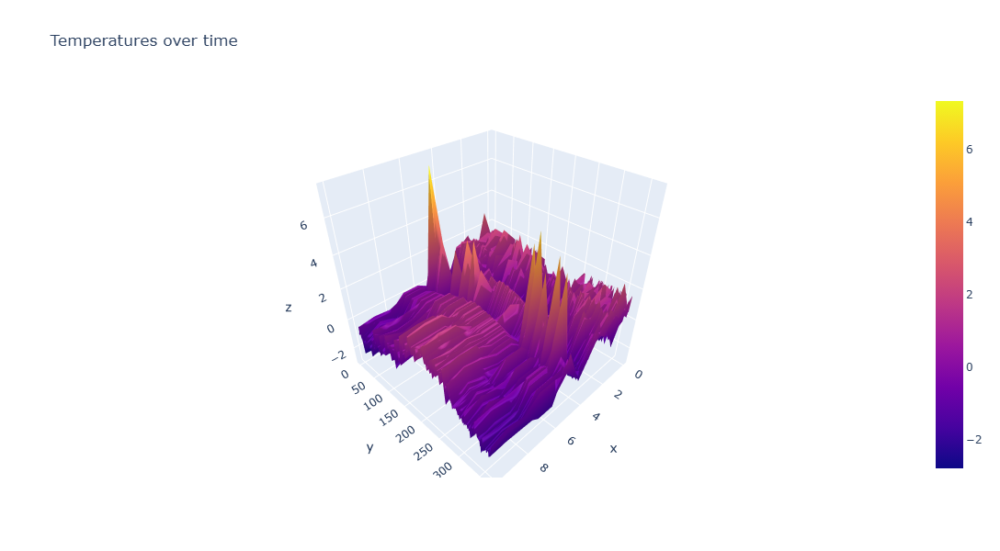

In [170]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyearmad.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [171]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [180]:
n_rowsmad = madridyear.shape[0]
n_rowsmad

366

In [182]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rowsmad,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsmad,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad,1) #<----INSERT WEATHER STATION HERE

In [183]:
X.shape, y.shape

((366, 2), (366, 1))

In [184]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=madridyear['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [187]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
madridyear['MADRID_temp_mean'].min()

-2.322710316206882

In [193]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
madridyear['MADRID_temp_mean'].max()

1.9366821017377809

In [195]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [197]:
compute_cost(X,y)

array([0.48699971])

In [199]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [201]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 328 ms
Wall time: 329 ms


In [202]:
theta

array([[-0.30397036],
       [ 0.09470993]])

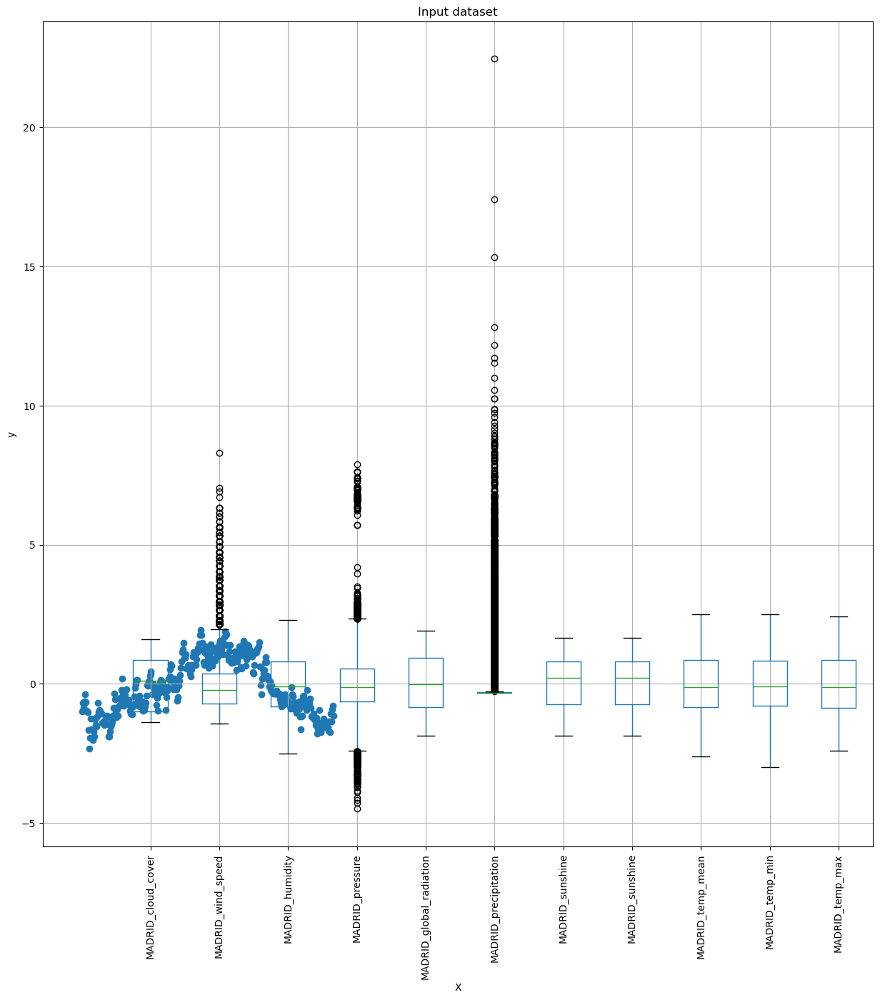

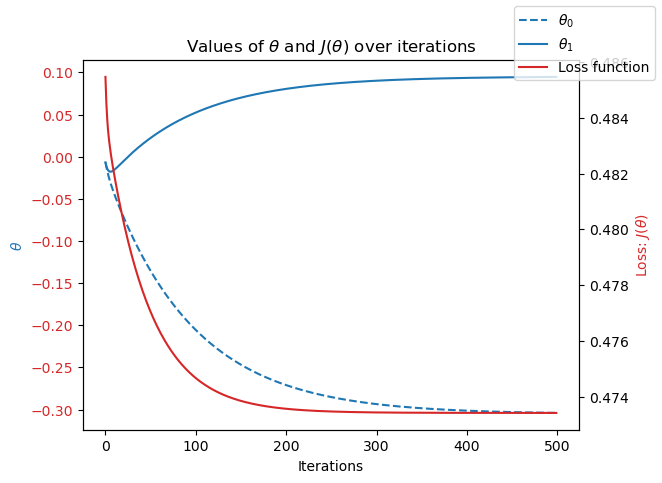

In [205]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
# Display the plot with the legend
plt.show()

In [206]:
%%time
# theta range
theta0_vals = np.linspace(-0.3,0,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(0,0.1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.86 s
Wall time: 1.88 s


In [208]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (Madrid 1990)

In [210]:
#Reduce your dataset to a single year
madridyear90 = madrid[madrid['DATE'].astype(str).str.contains('1990')] #<-----INSERT YEAR HERE
madridyear90

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
10958,1990-01-01,1,1.596048,-1.419038,2.112863,0.541729,-1.674090,1.385136,-1.859373,-1.859373,-0.974801,-0.473981,-1.322940
10959,1990-01-02,1,1.596048,-0.720267,1.774241,0.771160,-1.674090,0.992640,-1.859373,-1.859373,-1.136550,-0.691380,-1.438860
10960,1990-01-03,1,1.225610,-0.720267,1.604930,-0.632415,-1.548912,-0.132517,-1.738798,-1.738798,-1.069155,-0.800080,-1.253388
10961,1990-01-04,1,0.114295,-0.720267,0.758374,0.865631,-0.943887,-0.315682,-0.316007,-0.316007,-1.136550,-1.172765,-1.079508
10962,1990-01-05,1,-0.997020,-0.720267,1.040559,1.729370,-0.850003,-0.315682,-0.050740,-0.050740,-1.082634,-1.033008,-1.091100
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,1990-12-27,12,0.855172,-0.339119,1.548493,1.000591,-1.653227,-0.315682,-1.859373,-1.859373,-0.840010,-0.598209,-0.998364
11319,1990-12-28,12,1.596048,-0.529693,1.774241,1.472947,-1.569775,-0.080184,-1.811143,-1.811143,-0.907406,-0.567152,-1.137468
11320,1990-12-29,12,1.596048,-0.910841,2.056426,1.432460,-1.767973,-0.054018,-1.859373,-1.859373,-0.853490,-0.349752,-1.207020
11321,1990-12-30,12,1.596048,-1.228464,2.056426,1.553923,-1.715816,-0.263350,-1.859373,-1.859373,-0.893927,-0.411866,-1.230204


In [211]:
madridyear90.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1990-07-02 00:00:00,6.526027,-0.150594,-0.072664,-0.170905,0.306716,0.002663,-0.097533,-0.020085,-0.020085,0.063753,0.085770,0.045645
min,1990-01-01 00:00:00,1.000000,-1.367458,-1.419038,-2.514975,-2.305908,-1.830562,-0.315682,-1.859373,-1.859373,-1.743109,-1.871550,-1.832987
25%,1990-04-02 00:00:00,4.000000,-0.997020,-0.529693,-0.934738,-0.335505,-0.870866,-0.315682,-0.701848,-0.701848,-0.799573,-0.753495,-0.847668
50%,1990-07-02 00:00:00,7.000000,-0.256143,-0.212070,-0.201056,0.109860,-0.078074,-0.315682,0.190411,0.190411,-0.112140,-0.101296,-0.071005
75%,1990-10-01 00:00:00,10.000000,0.484733,0.359652,0.589063,0.879127,0.912917,-0.315682,0.769173,0.769173,0.993146,0.985703,0.972274
max,1990-12-31 00:00:00,12.000000,1.596048,2.265392,2.112863,2.849531,1.768298,5.938098,1.492626,1.492626,2.165827,2.321158,1.992369
std,NaN,3.452584,0.891112,0.630844,1.036050,0.912027,0.993170,0.709334,0.967090,0.967090,1.023386,1.039731,1.004720


In [212]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyearmad90 = madridyear90.drop(['DATE','MONTH'], axis=1)

In [213]:
notempyearmad90

,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
10958,1.596048,-1.419038,2.112863,0.541729,-1.674090,1.385136,-1.859373,-1.859373,-0.974801,-0.473981,-1.322940
10959,1.596048,-0.720267,1.774241,0.771160,-1.674090,0.992640,-1.859373,-1.859373,-1.136550,-0.691380,-1.438860
10960,1.225610,-0.720267,1.604930,-0.632415,-1.548912,-0.132517,-1.738798,-1.738798,-1.069155,-0.800080,-1.253388
10961,0.114295,-0.720267,0.758374,0.865631,-0.943887,-0.315682,-0.316007,-0.316007,-1.136550,-1.172765,-1.079508
10962,-0.997020,-0.720267,1.040559,1.729370,-0.850003,-0.315682,-0.050740,-0.050740,-1.082634,-1.033008,-1.091100
...,...,...,...,...,...,...,...,...,...,...,...
11318,0.855172,-0.339119,1.548493,1.000591,-1.653227,-0.315682,-1.859373,-1.859373,-0.840010,-0.598209,-0.998364
11319,1.596048,-0.529693,1.774241,1.472947,-1.569775,-0.080184,-1.811143,-1.811143,-0.907406,-0.567152,-1.137468
11320,1.596048,-0.910841,2.056426,1.432460,-1.767973,-0.054018,-1.859373,-1.859373,-0.853490,-0.349752,-1.207020
11321,1.596048,-1.228464,2.056426,1.553923,-1.715816,-0.263350,-1.859373,-1.859373,-0.893927,-0.411866,-1.230204


In [214]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyearmad90.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [215]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [217]:
n_rowsmad90 = madridyear90.shape[0]
n_rowsmad90

365

In [218]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rowsmad90,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsmad90,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear90['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad90,1) #<----INSERT WEATHER STATION HERE

In [224]:
X.shape, y.shape

((365, 2), (365, 1))

In [229]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=madridyear90['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [232]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
madridyear90['MADRID_temp_mean'].min()

-1.743109449208083

In [234]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
madridyear90['MADRID_temp_mean'].max()

2.1658266305512592

In [236]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [238]:
compute_cost(X,y)

array([0.52425693])

In [240]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [242]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.02 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 266 ms
Wall time: 267 ms


In [243]:
theta

array([[-0.12038745],
       [ 0.10281342]])

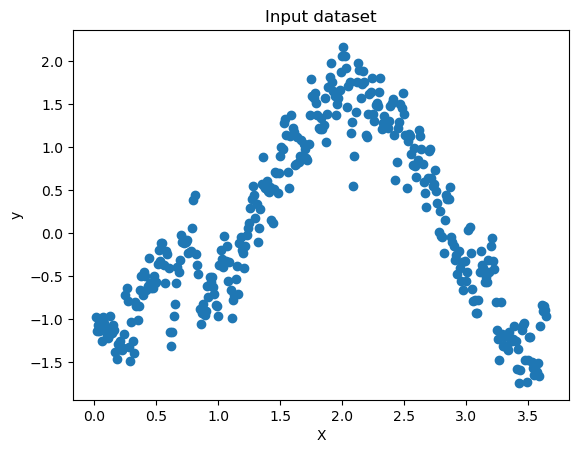

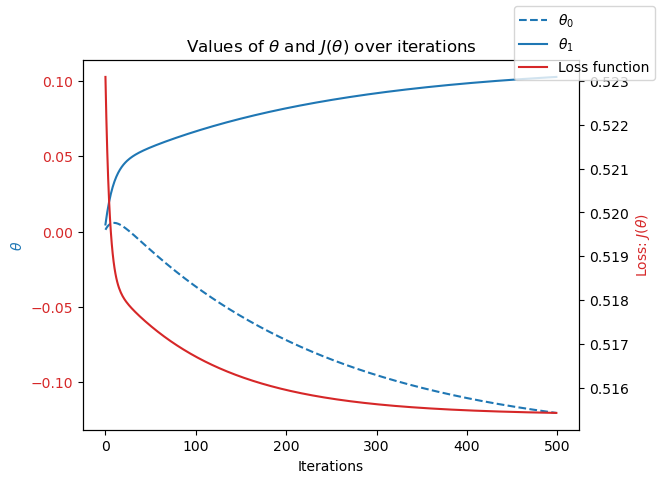

In [246]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
# Display the plot with the legend
plt.show()

In [247]:
%%time
# theta range
theta0_vals = np.linspace(-0.10,0,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(0.05,0.1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.89 s
Wall time: 1.9 s


In [249]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (Madrid 2020)


In [251]:
#Reduce your dataset to a single year
madridyear2020 = madrid[madrid['DATE'].astype(str).str.contains('2020')] #<-----INSERT YEAR HERE
madridyear2020

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
21915,2020-01-01,1,-0.997020,-1.228464,0.532626,2.039776,-0.808277,-0.315682,0.238641,0.238641,-1.123071,-1.265937,-0.998364
21916,2020-01-02,1,-0.997020,-1.037890,1.040559,1.972296,-0.808277,-0.315682,0.142180,0.142180,-1.203946,-1.312522,-1.079508
21917,2020-01-03,1,0.855172,-0.910841,1.266307,2.282702,-0.829140,-0.315682,-1.521762,-1.521762,-1.500486,-1.328051,-1.601148
21918,2020-01-04,1,-1.367458,0.169078,0.194003,2.215223,-1.444598,-0.315682,0.286871,0.286871,-1.069155,-1.126180,-0.998364
21919,2020-01-05,1,-1.367458,-0.720267,-0.257493,1.742866,-0.776983,-0.315682,0.214526,0.214526,-1.176988,-1.328051,-1.033140
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,2020-12-27,12,0.484733,1.058423,0.814811,-0.295017,-1.225536,0.259979,-1.063575,-1.063575,-1.635277,-1.762850,-1.496820
22277,2020-12-28,12,-0.626581,3.726459,0.194003,-1.779568,-0.881298,-0.289516,-0.050740,-0.050740,-1.244383,-1.110651,-1.311348
22278,2020-12-29,12,0.114295,1.376046,0.645500,-1.293715,-1.089927,-0.315682,-0.701848,-0.701848,-1.406132,-1.436751,-1.346124
22279,2020-12-30,12,-0.997020,0.550226,0.024692,0.190836,-0.870866,-0.315682,-0.050740,-0.050740,-1.365695,-1.374636,-1.322940


In [252]:
madridyear2020.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,366,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,2020-07-01 12:00:00,6.513661,0.112271,0.071361,-0.141689,0.078997,-0.260853,0.023480,0.041371,0.041371,0.145252,0.164726,0.126407
min,2020-01-01 00:00:00,1.000000,-1.367458,-1.419038,-1.894168,-2.683794,-1.684522,-0.315682,-1.859373,-1.859373,-1.635277,-1.762850,-1.635923
25%,2020-04-01 06:00:00,4.000000,-0.626581,-0.529693,-1.047612,-0.726886,-0.521412,-0.315682,-0.738021,-0.738021,-0.637824,-0.567152,-0.725952
50%,2020-07-01 12:00:00,7.000000,0.114295,-0.116783,-0.257493,-0.173554,-0.005053,-0.315682,0.286871,0.286871,-0.091921,-0.008124,-0.094189
75%,2020-09-30 18:00:00,9.750000,0.855172,0.502582,0.744265,0.710428,-0.005053,-0.289516,0.913864,0.913864,0.996516,0.915824,1.041826
max,2020-12-31 00:00:00,12.000000,1.596048,4.044082,2.225737,7.600092,1.121546,9.575233,1.589087,1.589087,2.327576,2.383272,2.270576
std,NaN,3.455958,0.979893,0.878973,1.036699,1.322900,0.537094,1.063649,1.019937,1.019937,1.003402,0.974058,1.024562


In [253]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyearmad2020 = madridyear2020.drop(['DATE','MONTH'], axis=1)

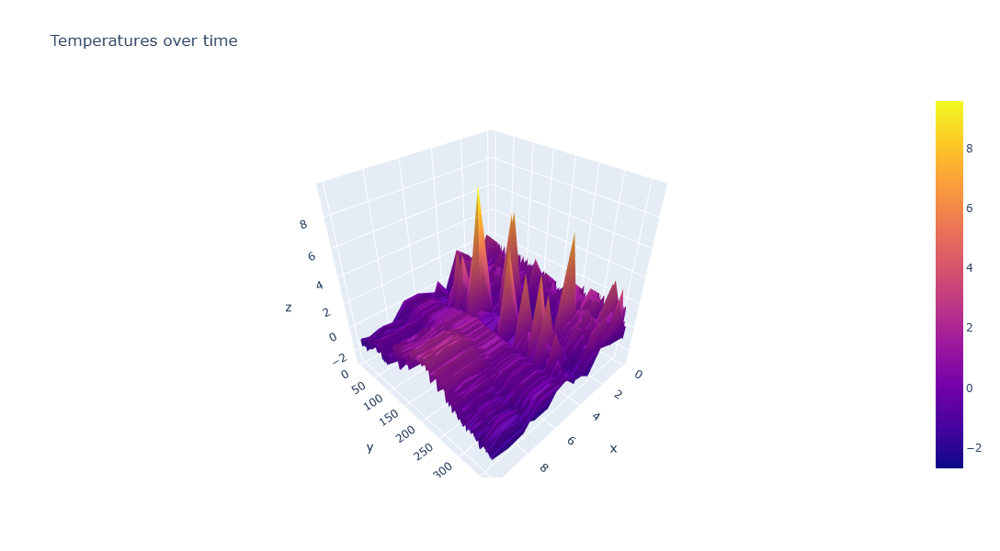

In [254]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyearmad2020.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [255]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [257]:
n_rowsmad2020 = madridyear2020.shape[0]
n_rowsmad2020

366

In [262]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rowsmad2020,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rowsmad2020,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear2020['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad2020,1) #<----INSERT WEATHER STATION HERE

In [263]:
X.shape, y.shape

((366, 2), (366, 1))

In [264]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=madridyear2020['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [271]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
madridyear2020['MADRID_temp_mean'].min()

-1.635276729766446

In [273]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
madridyear2020['MADRID_temp_mean'].max()

2.3275757097137157

In [275]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [277]:
compute_cost(X,y)

array([0.5125818])

In [279]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [281]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 375 ms
Wall time: 374 ms


In [282]:
theta

array([[-0.03700614],
       [ 0.10353204]])

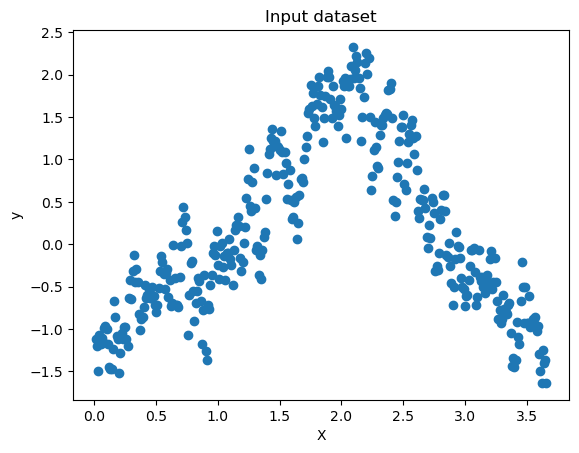

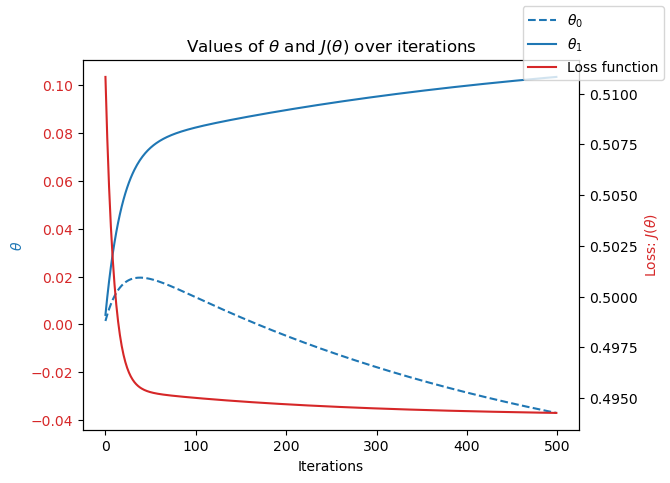

In [285]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
# Display the plot with the legend
plt.show()

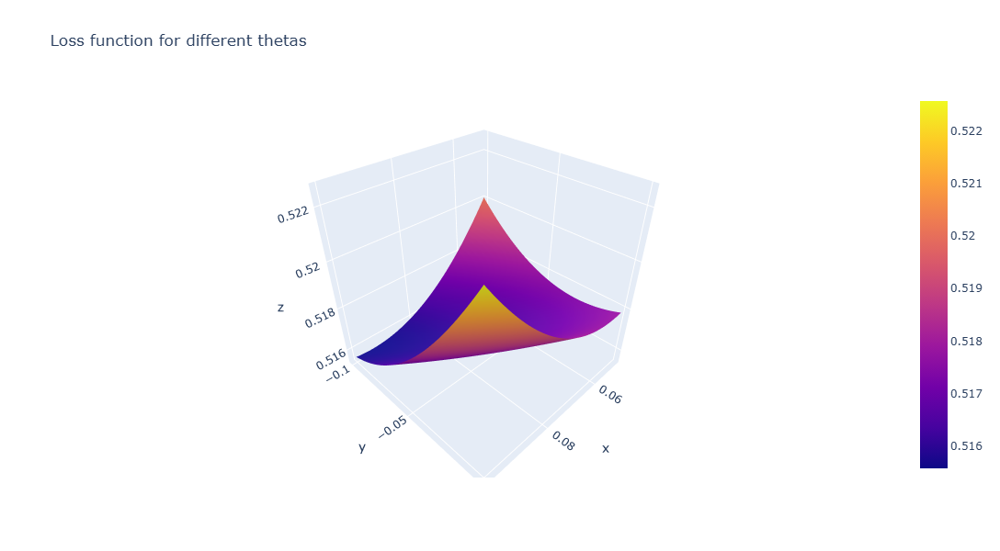

In [286]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (Stockholm 1960)


In [290]:
stockholm = df[['DATE', 'MONTH','STOCKHOLM_cloud_cover','STOCKHOLM_pressure',
      'STOCKHOLM_global_radiation','STOCKHOLM_precipitation','STOCKHOLM_sunshine',
      'STOCKHOLM_sunshine', 'STOCKHOLM_temp_mean', 'STOCKHOLM_temp_min','STOCKHOLM_temp_max']].copy()

In [292]:
stockholm['DATE'] = pd.to_datetime(stockholm['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [294]:
stockholm

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
0,1960-01-01,1,-0.060102,-0.003465,-1.079126,0.479131,-1.013295,-1.013295,-0.391072,-0.290439,-0.639538
1,1960-01-02,1,-0.060102,-0.003465,-1.079126,-0.251691,-1.013295,-1.013295,-0.415953,-0.183610,-0.628550
2,1960-01-03,1,-0.060102,-0.003465,-1.079126,-0.364125,-1.013295,-1.013295,-0.615003,-0.410621,-0.727444
3,1960-01-04,1,-0.060102,-0.003465,-1.079126,-0.420342,-1.013295,-1.013295,-0.764290,-0.530804,-0.925231
4,1960-01-05,1,-0.060102,-0.003465,-1.079126,3.289982,-1.013295,-1.013295,-0.503037,-0.477389,-0.705467
...,...,...,...,...,...,...,...,...,...,...,...
22945,2022-10-27,10,-0.060102,0.171364,-0.007044,-0.026822,-0.372092,-0.372092,0.517090,0.510778,0.382364
22946,2022-10-28,10,-0.060102,0.026293,-0.007044,-0.026822,-0.852994,-0.852994,0.641496,0.884680,0.393353
22947,2022-10-29,10,-0.060102,-0.208052,-0.007044,-0.026822,0.369298,0.369298,0.716139,1.031570,0.404341
22948,2022-10-30,10,-0.060102,0.167645,-0.007044,-0.026822,0.669862,0.669862,0.019467,0.096816,0.184577


In [296]:
# Drop the DATE and MONTH data as those numbers are not scaled with the rest
notempstock = stockholm.drop(['DATE', 'MONTH'], axis = 1)

In [298]:
#Look at a whisker plot of the data to see variations in temperatures
notempstock.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(1, 0, 'STOCKHOLM_cloud_cover'),
  Text(2, 0, 'STOCKHOLM_pressure'),
  Text(3, 0, 'STOCKHOLM_global_radiation'),
  Text(4, 0, 'STOCKHOLM_precipitation'),
  Text(5, 0, 'STOCKHOLM_sunshine'),
  Text(6, 0, 'STOCKHOLM_sunshine'),
  Text(7, 0, 'STOCKHOLM_temp_mean'),
  Text(8, 0, 'STOCKHOLM_temp_min'),
  Text(9, 0, 'STOCKHOLM_temp_max')])

In [299]:
#Reduce your dataset to a single year
stockholm1960 = stockholm[stockholm['DATE'].astype(str).str.contains('1960')] 
stockholm1960

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
0,1960-01-01,1,-0.060102,-0.003465,-1.079126,0.479131,-1.013295,-1.013295,-0.391072,-0.290439,-0.639538
1,1960-01-02,1,-0.060102,-0.003465,-1.079126,-0.251691,-1.013295,-1.013295,-0.415953,-0.183610,-0.628550
2,1960-01-03,1,-0.060102,-0.003465,-1.079126,-0.364125,-1.013295,-1.013295,-0.615003,-0.410621,-0.727444
3,1960-01-04,1,-0.060102,-0.003465,-1.079126,-0.420342,-1.013295,-1.013295,-0.764290,-0.530804,-0.925231
4,1960-01-05,1,-0.060102,-0.003465,-1.079126,3.289982,-1.013295,-1.013295,-0.503037,-0.477389,-0.705467
...,...,...,...,...,...,...,...,...,...,...,...
361,1960-12-27,12,-0.060102,-0.003465,-1.079126,0.001286,-1.013295,-1.013295,-0.403513,-0.103488,-0.694479
362,1960-12-28,12,-0.060102,-0.003465,-1.079126,-0.420342,-1.013295,-1.013295,-0.565240,-0.383914,-0.760408
363,1960-12-29,12,-0.060102,-0.003465,-1.079126,-0.054931,-1.013295,-1.013295,-0.615003,-0.383914,-0.749420
364,1960-12-30,12,-0.060102,-0.003465,-1.079126,0.029395,-1.013295,-1.013295,-0.726968,-0.504096,-0.903255


In [302]:
stockholm1960.describe()

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
count,366,366.000000,3.660000e+02,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1960-07-01 12:00:00,6.513661,-6.010231e-02,-3.464652e-03,-0.022021,0.195050,-0.056418,-0.056418,-0.092804,-0.105531,-0.112555
min,1960-01-01 00:00:00,1.000000,-6.010231e-02,-3.464652e-03,-1.079126,-0.420342,-1.013295,-1.013295,-2.356684,-2.613968,-2.232827
25%,1960-04-01 06:00:00,4.000000,-6.010231e-02,-3.464652e-03,-0.947644,-0.420342,-1.013295,-1.013295,-0.798501,-0.831260,-0.845567
50%,1960-07-01 12:00:00,7.000000,-6.010231e-02,-3.464652e-03,-0.361033,-0.420342,-0.422186,-0.422186,-0.179582,-0.156902,-0.298904
75%,1960-09-30 18:00:00,9.750000,-6.010231e-02,-3.464652e-03,0.781847,0.106693,0.880256,0.880256,0.877867,0.871326,0.788928
max,1960-12-31 00:00:00,12.000000,-6.010231e-02,-3.464652e-03,2.278717,11.019822,2.272868,2.272868,1.686504,1.565714,1.733913
std,NaN,3.455958,2.779357e-17,3.039922e-18,1.008680,1.400475,1.006546,1.006546,0.988702,1.033582,0.936670


In [304]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
stocknoyear = stockholm1960.drop(['DATE','MONTH'], axis=1)

In [306]:
stocknoyear

,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
0,-0.060102,-0.003465,-1.079126,0.479131,-1.013295,-1.013295,-0.391072,-0.290439,-0.639538
1,-0.060102,-0.003465,-1.079126,-0.251691,-1.013295,-1.013295,-0.415953,-0.183610,-0.628550
2,-0.060102,-0.003465,-1.079126,-0.364125,-1.013295,-1.013295,-0.615003,-0.410621,-0.727444
3,-0.060102,-0.003465,-1.079126,-0.420342,-1.013295,-1.013295,-0.764290,-0.530804,-0.925231
4,-0.060102,-0.003465,-1.079126,3.289982,-1.013295,-1.013295,-0.503037,-0.477389,-0.705467
...,...,...,...,...,...,...,...,...,...
361,-0.060102,-0.003465,-1.079126,0.001286,-1.013295,-1.013295,-0.403513,-0.103488,-0.694479
362,-0.060102,-0.003465,-1.079126,-0.420342,-1.013295,-1.013295,-0.565240,-0.383914,-0.760408
363,-0.060102,-0.003465,-1.079126,-0.054931,-1.013295,-1.013295,-0.615003,-0.383914,-0.749420
364,-0.060102,-0.003465,-1.079126,0.029395,-1.013295,-1.013295,-0.726968,-0.504096,-0.903255


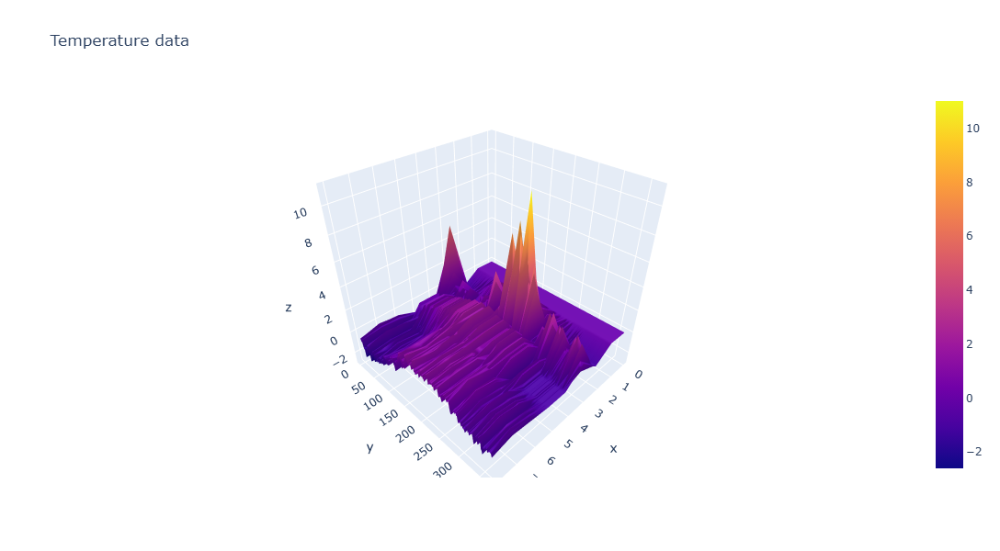

In [308]:
fig = go.Figure(data=[go.Surface(z=stocknoyear.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                  width=600, height=600)
fig.show()

In [309]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [310]:
stock_rows = stocknoyear.shape[0]
stock_rows

366

In [311]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(stock_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((stock_rows,1))
X = np.concatenate((ones, X), axis=1)
y=stockholm1960['STOCKHOLM_temp_mean'].to_numpy().reshape(stock_rows,1) 

In [316]:
X.shape, y.shape

((366, 2), (366, 1))

In [318]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=stockholm1960['STOCKHOLM_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [320]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
stockholm1960['STOCKHOLM_temp_mean'].min()

-2.356683584001993

In [322]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
stockholm1960['STOCKHOLM_temp_mean'].max()

1.6865044645383225

In [324]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [326]:
compute_cost(X,y)

array([0.49173644])

In [328]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [330]:
%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=300 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 0 ns


In [331]:
theta

array([[-0.68360342],
       [ 0.32209197]])

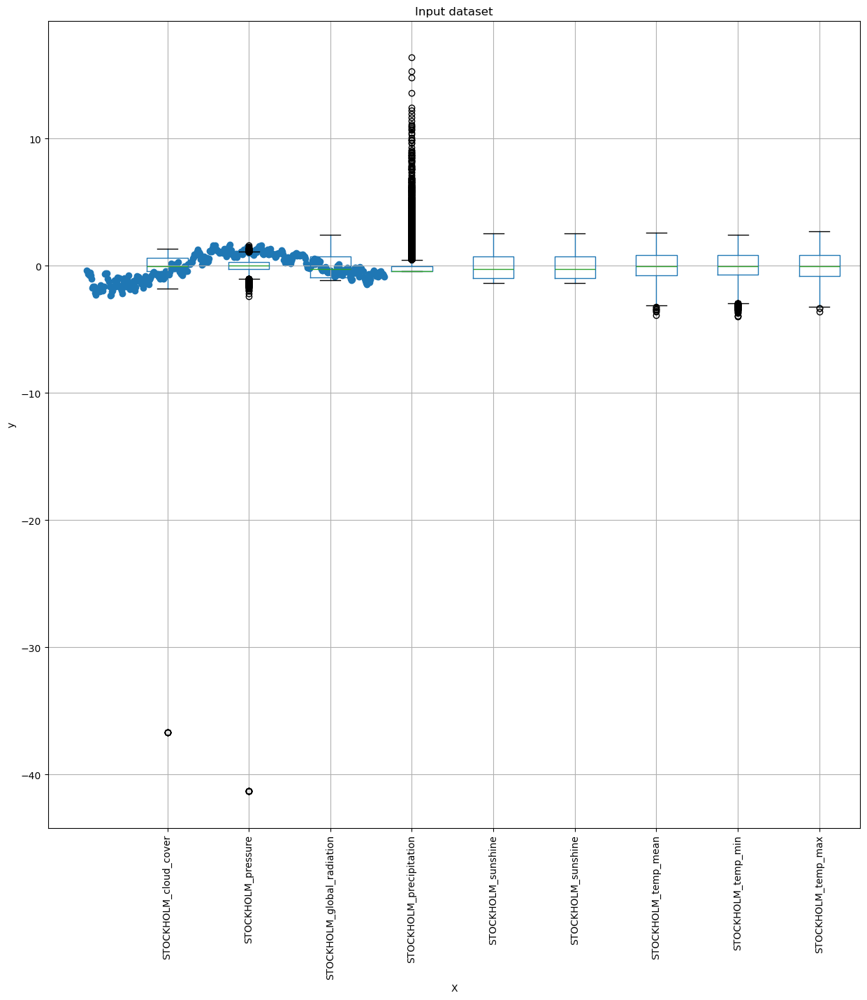

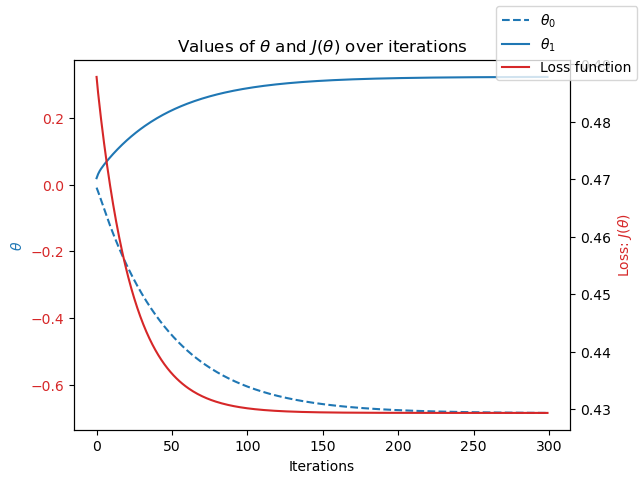

In [334]:

#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()
# Display the plot with the legend
plt.show()

In [335]:
%%time
# theta range
theta0_vals = np.linspace(10, -10.6, 100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10, 10.25, 100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.14 s
Wall time: 2.15 s


In [336]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (Stockholm 1990)


In [339]:
#Reduce your dataset to a single year
stockholm1990 = stockholm[stockholm['DATE'].astype(str).str.contains('1990')] 
stockholm1990

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
10958,1990-01-01,1,0.291952,0.390831,-0.998214,-0.420342,-0.632581,-0.632581,-1.274353,-1.145070,-1.210924
10959,1990-01-02,1,0.996060,0.424309,-1.079126,-0.392233,-1.013295,-1.013295,-1.448521,-1.251899,-1.551558
10960,1990-01-03,1,0.996060,0.621456,-1.079126,-0.420342,-1.013295,-1.013295,-1.361437,-1.238545,-1.463653
10961,1990-01-04,1,0.996060,0.517303,-1.079126,-0.420342,-1.013295,-1.013295,-0.938458,-0.931412,-1.123019
10962,1990-01-05,1,0.996060,0.316435,-1.079126,-0.420342,-1.013295,-1.013295,-0.963339,-0.691047,-1.090054
...,...,...,...,...,...,...,...,...,...,...,...
11318,1990-12-27,12,0.996060,-1.171472,-1.079126,0.591565,-1.013295,-1.013295,-0.453275,-0.250378,-0.639538
11319,1990-12-28,12,-1.116265,-0.646984,-1.028556,-0.420342,-0.792881,-0.792881,-0.639884,-0.423975,-0.628550
11320,1990-12-29,12,0.996060,-0.803215,-1.079126,1.238060,-1.013295,-1.013295,-0.565240,-0.570865,-0.760408
11321,1990-12-30,12,0.291952,-0.699061,-0.998214,-0.420342,-0.552430,-0.552430,-0.602562,-0.357207,-0.782385


In [340]:
stockholm1990.describe()

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1990-07-02 00:00:00,6.526027,-0.134371,-0.191236,-0.018682,0.075754,-0.071638,-0.071638,0.131603,0.156194,0.096069
min,1990-01-01 00:00:00,1.000000,-36.673729,-41.307767,-1.079126,-0.420342,-1.353933,-1.353933,-1.572927,-1.559032,-1.551558
25%,1990-04-02 00:00:00,4.000000,-0.412156,-0.297326,-0.927416,-0.420342,-1.013295,-1.013295,-0.552800,-0.450682,-0.628550
50%,1990-07-02 00:00:00,7.000000,0.291952,-0.014624,-0.350919,-0.420342,-0.372092,-0.372092,0.081670,0.070109,0.030742
75%,1990-10-01 00:00:00,10.000000,0.996060,0.212282,0.781847,0.001286,0.569674,0.569674,0.828105,0.817912,0.843869
max,1990-12-31 00:00:00,12.000000,0.996060,0.878120,2.359629,6.213267,2.453206,2.453206,1.985078,1.899555,1.931700
std,NaN,3.452584,2.837796,2.202872,1.003895,1.000808,0.987191,0.987191,0.789326,0.777781,0.822246


In [341]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
stockno1990 = stockholm1990.drop(['DATE','MONTH'], axis=1)

In [342]:
stockno1990

,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
10958,0.291952,0.390831,-0.998214,-0.420342,-0.632581,-0.632581,-1.274353,-1.145070,-1.210924
10959,0.996060,0.424309,-1.079126,-0.392233,-1.013295,-1.013295,-1.448521,-1.251899,-1.551558
10960,0.996060,0.621456,-1.079126,-0.420342,-1.013295,-1.013295,-1.361437,-1.238545,-1.463653
10961,0.996060,0.517303,-1.079126,-0.420342,-1.013295,-1.013295,-0.938458,-0.931412,-1.123019
10962,0.996060,0.316435,-1.079126,-0.420342,-1.013295,-1.013295,-0.963339,-0.691047,-1.090054
...,...,...,...,...,...,...,...,...,...
11318,0.996060,-1.171472,-1.079126,0.591565,-1.013295,-1.013295,-0.453275,-0.250378,-0.639538
11319,-1.116265,-0.646984,-1.028556,-0.420342,-0.792881,-0.792881,-0.639884,-0.423975,-0.628550
11320,0.996060,-0.803215,-1.079126,1.238060,-1.013295,-1.013295,-0.565240,-0.570865,-0.760408
11321,0.291952,-0.699061,-0.998214,-0.420342,-0.552430,-0.552430,-0.602562,-0.357207,-0.782385


In [343]:
fig = go.Figure(data=[go.Surface(z=stockno1990.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                  width=600, height=600)
fig.show()

In [344]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [345]:
stock_rows90 = stockno1990.shape[0]
stock_rows90

365

In [346]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(stock_rows90,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((stock_rows90,1))
X = np.concatenate((ones, X), axis=1)
y=stockholm1990['STOCKHOLM_temp_mean'].to_numpy().reshape(stock_rows90,1) 

In [347]:
X.shape, y.shape

((365, 2), (365, 1))

In [348]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=stockholm1990['STOCKHOLM_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [350]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
stockholm1990['STOCKHOLM_temp_mean'].min()

-1.5729271315157165

In [356]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
stockholm1990['STOCKHOLM_temp_mean'].max()

1.9850783511997607

In [357]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [367]:
compute_cost(X,y)

array([0.3193237])

In [369]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [371]:
%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=100 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 0 ns


In [373]:
theta

array([[0.02980705],
       [0.05230967]])

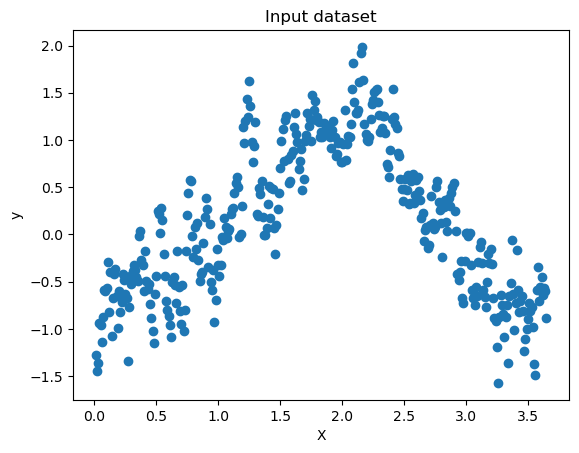

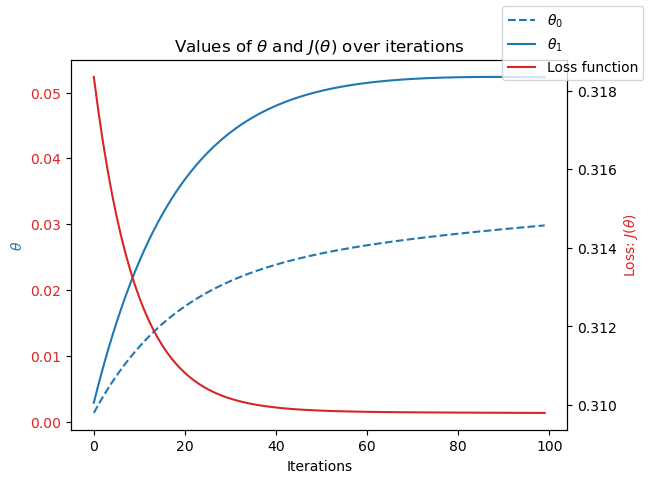

In [375]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()
# Display the plot with the legend
plt.show()

In [377]:
%%time
# theta range
theta0_vals = np.linspace(-9.98, 10.02, 100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.95, 10.05, 100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.94 s
Wall time: 1.94 s


In [378]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### look at a year of temperature data for one of the weather stations (Stockholm 2020)


In [380]:
#Reduce your dataset to a single year
stockholm2020 = stockholm[stockholm['DATE'].astype(str).str.contains('2020')] 
stockholm2020

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
21915,2020-01-01,1,-0.060102,0.037453,-0.007044,-0.420342,-1.013295,-1.013295,-0.478156,-0.423975,-0.606573
21916,2020-01-02,1,-0.060102,-0.174574,-0.007044,-0.420342,-0.933144,-0.933144,-0.192023,0.083463,-0.430762
21917,2020-01-03,1,-0.060102,-0.583748,-0.007044,-0.420342,-0.953182,-0.953182,-0.241785,-0.010013,-0.265939
21918,2020-01-04,1,-0.060102,-0.438677,-0.007044,-0.420342,-0.311979,-0.311979,-0.615003,-0.370560,-0.694479
21919,2020-01-05,1,-0.060102,0.264359,-0.007044,0.422914,-0.512355,-0.512355,-0.901136,-0.784522,-0.969184
...,...,...,...,...,...,...,...,...,...,...,...
22276,2020-12-27,12,-0.060102,-0.624666,-1.079126,-0.364125,-1.013295,-1.013295,-0.391072,-0.544157,-0.595585
22277,2020-12-28,12,-0.060102,-0.606067,-1.079126,1.575363,-1.013295,-1.013295,-0.391072,-0.130195,-0.650526
22278,2020-12-29,12,-0.060102,-0.673023,-1.079126,0.563456,-1.013295,-1.013295,-0.366191,-0.223670,-0.562621
22279,2020-12-30,12,-0.060102,-0.561430,-1.079126,0.366697,-1.013295,-1.013295,-0.565240,-0.437328,-0.694479


In [381]:
stockholm2020.describe()

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
count,366,366.000000,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,2020-07-01 12:00:00,6.513661,-6.010231e-02,-0.044778,-0.097406,-0.033504,0.145819,0.145819,0.295811,0.317808,0.272813
min,2020-01-01 00:00:00,1.000000,-6.010231e-02,-1.800113,-1.079126,-0.420342,-1.013295,-1.013295,-1.075304,-1.198484,-1.188948
25%,2020-04-01 06:00:00,4.000000,-6.010231e-02,-0.286167,-0.007044,-0.420342,-0.953182,-0.953182,-0.328869,-0.300454,-0.419774
50%,2020-07-01 12:00:00,7.000000,-6.010231e-02,-0.022063,-0.007044,-0.420342,-0.021435,-0.021435,0.112771,0.163584,0.091177
75%,2020-09-30 18:00:00,9.750000,-6.010231e-02,0.212282,-0.007044,-0.118175,0.965416,0.965416,0.949400,0.961463,0.964739
max,2020-12-31 00:00:00,12.000000,-6.010231e-02,1.052949,-0.007044,7.618692,2.533357,2.533357,2.159246,1.952969,2.184429
std,NaN,3.455958,2.779357e-17,0.402780,0.297498,0.924684,1.066169,1.066169,0.788996,0.753735,0.834780


In [382]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
stockno2020 = stockholm2020.drop(['DATE','MONTH'], axis=1)

In [383]:
fig = go.Figure(data=[go.Surface(z=stockno2020.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                  width=600, height=600)
fig.show()

In [386]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [390]:
stock_rows2020 = stockno2020.shape[0]
stock_rows2020

366

In [394]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(stock_rows2020,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((stock_rows2020,1))
X = np.concatenate((ones, X), axis=1)
y=stockholm2020['STOCKHOLM_temp_mean'].to_numpy().reshape(stock_rows2020,1) 

In [396]:
X.shape, y.shape

((366, 2), (366, 1))

In [398]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=stockholm2020['STOCKHOLM_temp_mean']) 
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [400]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
stockholm2020['STOCKHOLM_temp_mean'].min()

-1.0753039870799852

In [402]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
stockholm2020['STOCKHOLM_temp_mean'].max()

2.1592464517522667

In [404]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [406]:
compute_cost(X,y)

array([0.35415859])

In [408]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [410]:
%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=150 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 0 ns


In [412]:
theta

array([[-0.0506269 ],
       [ 0.18933487]])

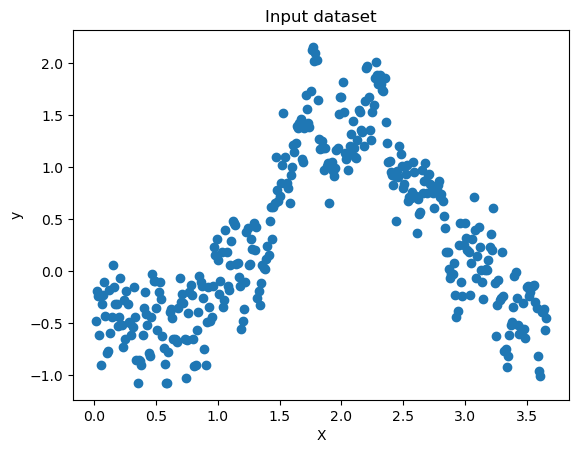

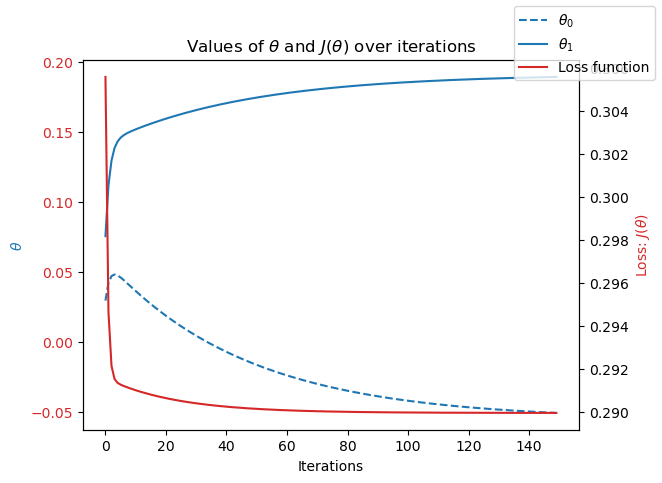

In [414]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()
# Display the plot with the legend
plt.show()

In [416]:
%%time
# theta range
theta0_vals = np.linspace(-10.02, 9.98, 100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.82, 10.18, 100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 1.7 s
Wall time: 1.72 s


In [417]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()